<a href="https://colab.research.google.com/github/darbyna/603HW/blob/master/DATA_603_PROJECT_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data 603 Semester Project
[Insert Title Here]
[Insert background and description of project]
[]

# Directions:
The report should include the following information:

- One slide showing accomplishment so far
- One slide showing any changes since the defense
- Your expectation whether you will achieve the desired results mentioned in the defense or not.
- Any deviation due to COVID-19 and the inability to access the campus
- Show evidence of your progress
- The phases of the project you completed
- The phases that are in progress now
- The phases that are not started yet

#Mission for the Analysis:
- Find cities and days with the most solar and temperature fluctuations. 
- Linear regression to predict 2021.

In [ ]:
#You can see what GPU you've been assigned at any time by executing the following cell.


gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, 
and then re-execute this cell.


In [ ]:
#You can see how much memory you have available at any time by running the following code.
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 38.0 gigabytes of available RAM

You are using a high-RAM runtime!


Import Libraries

In [ ]:
!pip install -q findspark
!pip install pyspark
!pip install ScalaFunctional

     |████████████████████████████████| 212.3MB 36kB/s 
     |████████████████████████████████| 204kB 51.2MB/s 
  Created wheel for pyspark: filename=pyspark-3.1.1-py2.py3-none-any.whl size=212767604 sha256=072b65114258c3ead7e0a103929d9c948a116d32deb024e70eef270ea864bba0
  Stored in directory: /root/.cache/pip/wheels/0b/90/c0/01de724414ef122bd05f056541fb6a0ecf47c7ca655f8b3c0f
Successfully built pyspark
     |████████████████████████████████| 51kB 3.0MB/s 


In [ ]:
#Import necessary packages: 
import os 
import glob
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.ml.regression import LinearRegression
import requests
from bs4 import BeautifulSoup
from functional import seq #ScalaFunctional: Actually works compared to Pyspark.
from pyspark.ml.linalg import DenseVector
from pyspark.ml.feature import StandardScaler

In [ ]:
#Import the header file
df_header = pd.read_table(
  'https://raw.githubusercontent.com/darbyna/603Project/master/HEADERS%20(1).csv',
   sep='\s+', 
   engine='python',
   skiprows = 1,
   )

df_header.shape
print(df_header)
header_list = list(df_header.columns)
print(header_list)


  "WBANNO  LST_DATE  ... SOIL_TEMP_50_DAILY SOIL_TEMP_100_DAILY"
0  "XXXXX  YYYYMMDD  ...            Celsius             Celsius"

[1 rows x 28 columns]
['"WBANNO', 'LST_DATE', 'CRX_VN', 'LONGITUDE', 'LATITUDE', 'T_DAILY_MAX', 'T_DAILY_MIN', 'T_DAILY_MEAN', 'T_DAILY_AVG', 'P_DAILY_CALC', 'SOLARAD_DAILY', 'SUR_TEMP_DAILY_TYPE', 'SUR_TEMP_DAILY_MAX', 'SUR_TEMP_DAILY_MIN', 'SUR_TEMP_DAILY_AVG', 'RH_DAILY_MAX', 'RH_DAILY_MIN', 'RH_DAILY_AVG', 'SOIL_MOISTURE_5_DAILY', 'SOIL_MOISTURE_10_DAILY', 'SOIL_MOISTURE_20_DAILY', 'SOIL_MOISTURE_50_DAILY', 'SOIL_MOISTURE_100_DAILY', 'SOIL_TEMP_5_DAILY', 'SOIL_TEMP_10_DAILY', 'SOIL_TEMP_20_DAILY', 'SOIL_TEMP_50_DAILY', 'SOIL_TEMP_100_DAILY"']


In [ ]:
#Procure all of the .txt files for analysis:
#Create a groovy function: 
def HTML_URLCounter(html_url): 
    #Import the data and visualize the HTML file:
    #Assistance received from: https://www.crummy.com/software/BeautifulSoup/bs4/doc/
    Powerful_Y = requests.get(html_url)
    Powerful_X = BeautifulSoup(Powerful_Y.text, "html.parser")
    The_HTML = Powerful_X.prettify()
    #Now let's get all of the url tags:
    #Assistance received from: https://www.crummy.com/software/BeautifulSoup/bs4/doc/
    #Assistance with ScalaFunctional received from here: https://pypi.org/project/ScalaFunctional/

    All_URL = Powerful_X.findAll('a')
    All_URL


    #Next, create a for loop that will provide us with all of the urls in the HTML file:
    #Assistance with ScalaFunctional received from here: https://pypi.org/project/ScalaFunctional/
    #The seq(url_tags).count(all) is a primary example of ScalaFunctional’s Spark Program counting the images.
    url_tags = []
    for url_link in All_URL:
        url_tags.append(url_link.get('href'))
    return url_tags[5:]


#Call the newly created function: 
HTML_URLCounter("https://www1.ncdc.noaa.gov/pub/data/uscrn/products/daily01/2020/")

['CRND0103-2020-AK_Aleknagik_1_NNE.txt',
 'CRND0103-2020-AK_Bethel_87_WNW.txt',
 'CRND0103-2020-AK_Cordova_14_ESE.txt',
 'CRND0103-2020-AK_Deadhorse_3_S.txt',
 'CRND0103-2020-AK_Denali_27_N.txt',
 'CRND0103-2020-AK_Fairbanks_11_NE.txt',
 'CRND0103-2020-AK_Glennallen_64_N.txt',
 'CRND0103-2020-AK_Gustavus_2_NE.txt',
 'CRND0103-2020-AK_Ivotuk_1_NNE.txt',
 'CRND0103-2020-AK_Kenai_29_ENE.txt',
 'CRND0103-2020-AK_King_Salmon_42_SE.txt',
 'CRND0103-2020-AK_Metlakatla_6_S.txt',
 'CRND0103-2020-AK_Port_Alsworth_1_SW.txt',
 'CRND0103-2020-AK_Red_Dog_Mine_3_SSW.txt',
 'CRND0103-2020-AK_Ruby_44_ESE.txt',
 'CRND0103-2020-AK_Sand_Point_1_ENE.txt',
 'CRND0103-2020-AK_Selawik_28_E.txt',
 'CRND0103-2020-AK_Sitka_1_NE.txt',
 'CRND0103-2020-AK_St._Paul_4_NE.txt',
 'CRND0103-2020-AK_Tok_70_SE.txt',
 'CRND0103-2020-AK_Toolik_Lake_5_ENE.txt',
 'CRND0103-2020-AK_Utqiagvik_formerly_Barrow_4_ENE.txt',
 'CRND0103-2020-AK_Yakutat_3_SSE.txt',
 'CRND0103-2020-AL_Brewton_3_NNE.txt',
 'CRND0103-2020-AL_Clanton_2_NE

In [ ]:
#Extract URLs of data and port them into data frame:
spark = SparkSession.builder.appName('603PROJ').getOrCreate()
sc = SparkContext.getOrCreate(spark)
list_monger = [] 
url = HTML_URLCounter("https://www1.ncdc.noaa.gov/pub/data/uscrn/products/daily01/2020/")
for x in range(0,50,1):
    # In next update, port data using Apache Spark: 
    piper = pd.read_table(
            'https://www1.ncdc.noaa.gov/pub/data/uscrn/products/daily01/2020/'+ url[x],
            sep='\s+', 
            engine='python',
            header = None,
            names = header_list
            )
    
    # In next update, add on column using Apache Spark:
    piper['State'] = url[x][14:16]
    l = len(url[x])
    piper['City'] = url[x][18:l-4]
    piper = spark.createDataFrame(piper).collect()
    #Add Apache Spark DataFrame to the list in next update:
    list_monger = list_monger + [piper]
    print(x+1)
print(list_monger)
    

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
len(url)

157

In [ ]:
#Data is now cleaned and ready for exploratory analysis:
# clean_data = pd.concat(list_monger).reset_index().drop(columns=['index'])
# clean_data

In [ ]:
list_monger

[[Row("WBANNO=23583, LST_DATE=20200101, CRX_VN=2.5140000000000002, LONGITUDE=-158.61, LATITUDE=59.28, T_DAILY_MAX=-19.0, T_DAILY_MIN=-27.8, T_DAILY_MEAN=-23.4, T_DAILY_AVG=-21.0, P_DAILY_CALC=0.0, SOLARAD_DAILY=0.31, SUR_TEMP_DAILY_TYPE='C', SUR_TEMP_DAILY_MAX=-20.0, SUR_TEMP_DAILY_MIN=-36.2, SUR_TEMP_DAILY_AVG=-25.2, RH_DAILY_MAX=79.3, RH_DAILY_MIN=49.9, RH_DAILY_AVG=62.6, SOIL_MOISTURE_5_DAILY=-99.0, SOIL_MOISTURE_10_DAILY=-99.0, SOIL_MOISTURE_20_DAILY=-99.0, SOIL_MOISTURE_50_DAILY=-99.0, SOIL_MOISTURE_100_DAILY=-99.0, SOIL_TEMP_5_DAILY=-9999.0, SOIL_TEMP_10_DAILY=-9999.0, SOIL_TEMP_20_DAILY=-9999.0, SOIL_TEMP_50_DAILY=-9999.0, SOIL_TEMP_100_DAILY"=-9999.0, State='AK', City='leknagik_1_NNE'),
  Row("WBANNO=23583, LST_DATE=20200102, CRX_VN=2.5140000000000002, LONGITUDE=-158.61, LATITUDE=59.28, T_DAILY_MAX=-21.8, T_DAILY_MIN=-28.0, T_DAILY_MEAN=-24.9, T_DAILY_AVG=-24.1, P_DAILY_CALC=0.0, SOLARAD_DAILY=0.9, SUR_TEMP_DAILY_TYPE='C', SUR_TEMP_DAILY_MAX=-25.7, SUR_TEMP_DAILY_MIN=-36.4, SUR

In [ ]:
result = sum(list_monger, [])

In [ ]:
lion = spark.createDataFrame(result)

In [ ]:
lion.printSchema()

root
 |-- "WBANNO: long (nullable = true)
 |-- LST_DATE: long (nullable = true)
 |-- CRX_VN: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- T_DAILY_MAX: double (nullable = true)
 |-- T_DAILY_MIN: double (nullable = true)
 |-- T_DAILY_MEAN: double (nullable = true)
 |-- T_DAILY_AVG: double (nullable = true)
 |-- P_DAILY_CALC: double (nullable = true)
 |-- SOLARAD_DAILY: double (nullable = true)
 |-- SUR_TEMP_DAILY_TYPE: string (nullable = true)
 |-- SUR_TEMP_DAILY_MAX: double (nullable = true)
 |-- SUR_TEMP_DAILY_MIN: double (nullable = true)
 |-- SUR_TEMP_DAILY_AVG: double (nullable = true)
 |-- RH_DAILY_MAX: double (nullable = true)
 |-- RH_DAILY_MIN: double (nullable = true)
 |-- RH_DAILY_AVG: double (nullable = true)
 |-- SOIL_MOISTURE_5_DAILY: double (nullable = true)
 |-- SOIL_MOISTURE_10_DAILY: double (nullable = true)
 |-- SOIL_MOISTURE_20_DAILY: double (nullable = true)
 |-- SOIL_MOISTURE_50_DAILY: double (nullable

In [ ]:
lion.count()

18290

#Exploratory Data Analysis 

#### Apache Spark Analysis (Pyspark)


In [ ]:
#Port DataFrame into Apache Spark:

# spark = SparkSession.builder.appName('603PROJ').getOrCreate()
# sc = SparkContext.getOrCreate(spark)
# sparkDF=spark.createDataFrame(clean_data) 
# sparkDF.printSchema()
# sparkDF.show()

In [ ]:
# View the DataFrame: 
lion.show()

+-------+--------+------------------+---------+--------+-----------+-----------+------------+-----------+------------+-------------+-------------------+------------------+------------------+------------------+------------+------------+------------+---------------------+----------------------+----------------------+----------------------+-----------------------+-----------------+------------------+------------------+------------------+--------------------+-----+--------------+
|"WBANNO|LST_DATE|            CRX_VN|LONGITUDE|LATITUDE|T_DAILY_MAX|T_DAILY_MIN|T_DAILY_MEAN|T_DAILY_AVG|P_DAILY_CALC|SOLARAD_DAILY|SUR_TEMP_DAILY_TYPE|SUR_TEMP_DAILY_MAX|SUR_TEMP_DAILY_MIN|SUR_TEMP_DAILY_AVG|RH_DAILY_MAX|RH_DAILY_MIN|RH_DAILY_AVG|SOIL_MOISTURE_5_DAILY|SOIL_MOISTURE_10_DAILY|SOIL_MOISTURE_20_DAILY|SOIL_MOISTURE_50_DAILY|SOIL_MOISTURE_100_DAILY|SOIL_TEMP_5_DAILY|SOIL_TEMP_10_DAILY|SOIL_TEMP_20_DAILY|SOIL_TEMP_50_DAILY|SOIL_TEMP_100_DAILY"|State|          City|
+-------+--------+------------------+-

In [ ]:
# Check out the distinct values and their datatypes in the Spark DataFrame: 
lion.distinct()

DataFrame["WBANNO: bigint, LST_DATE: bigint, CRX_VN: double, LONGITUDE: double, LATITUDE: double, T_DAILY_MAX: double, T_DAILY_MIN: double, T_DAILY_MEAN: double, T_DAILY_AVG: double, P_DAILY_CALC: double, SOLARAD_DAILY: double, SUR_TEMP_DAILY_TYPE: string, SUR_TEMP_DAILY_MAX: double, SUR_TEMP_DAILY_MIN: double, SUR_TEMP_DAILY_AVG: double, RH_DAILY_MAX: double, RH_DAILY_MIN: double, RH_DAILY_AVG: double, SOIL_MOISTURE_5_DAILY: double, SOIL_MOISTURE_10_DAILY: double, SOIL_MOISTURE_20_DAILY: double, SOIL_MOISTURE_50_DAILY: double, SOIL_MOISTURE_100_DAILY: double, SOIL_TEMP_5_DAILY: double, SOIL_TEMP_10_DAILY: double, SOIL_TEMP_20_DAILY: double, SOIL_TEMP_50_DAILY: double, SOIL_TEMP_100_DAILY": double, State: string, City: string]

In [ ]:
# Utilize Spark's collect function to view the unique rows and understand the data formatting:   
lion.collect()

[Row("WBANNO=23583, LST_DATE=20200101, CRX_VN=2.5140000000000002, LONGITUDE=-158.61, LATITUDE=59.28, T_DAILY_MAX=-19.0, T_DAILY_MIN=-27.8, T_DAILY_MEAN=-23.4, T_DAILY_AVG=-21.0, P_DAILY_CALC=0.0, SOLARAD_DAILY=0.31, SUR_TEMP_DAILY_TYPE='C', SUR_TEMP_DAILY_MAX=-20.0, SUR_TEMP_DAILY_MIN=-36.2, SUR_TEMP_DAILY_AVG=-25.2, RH_DAILY_MAX=79.3, RH_DAILY_MIN=49.9, RH_DAILY_AVG=62.6, SOIL_MOISTURE_5_DAILY=-99.0, SOIL_MOISTURE_10_DAILY=-99.0, SOIL_MOISTURE_20_DAILY=-99.0, SOIL_MOISTURE_50_DAILY=-99.0, SOIL_MOISTURE_100_DAILY=-99.0, SOIL_TEMP_5_DAILY=-9999.0, SOIL_TEMP_10_DAILY=-9999.0, SOIL_TEMP_20_DAILY=-9999.0, SOIL_TEMP_50_DAILY=-9999.0, SOIL_TEMP_100_DAILY"=-9999.0, State='AK', City='leknagik_1_NNE'),
 Row("WBANNO=23583, LST_DATE=20200102, CRX_VN=2.5140000000000002, LONGITUDE=-158.61, LATITUDE=59.28, T_DAILY_MAX=-21.8, T_DAILY_MIN=-28.0, T_DAILY_MEAN=-24.9, T_DAILY_AVG=-24.1, P_DAILY_CALC=0.0, SOLARAD_DAILY=0.9, SUR_TEMP_DAILY_TYPE='C', SUR_TEMP_DAILY_MAX=-25.7, SUR_TEMP_DAILY_MIN=-36.4, SUR_T

In [ ]:
# Count the number of rows in the dataset:
lion.count()

18290

In [ ]:
# Convert the Apache Spark DataFrame back to Pandas for the visualization of the EDA: 
clean_data = lion.toPandas()

#### Scatter Plot

In [ ]:
#Conduct a few data visualizations: bar charts, histograms, scatter plots:
# Graphs
def temperature_extractor(): 
  """The Temperature Extractor allows the user to input any city or state and return 
  a visualization of the min/max daily temperature and min/max relative humidity for that location for the year 2020."""

  getState = input('State (Use 2-Letter Acronym): ')

  from google.colab import files
  from matplotlib.pyplot import figure
  newer_list = []
  super_list = list(clean_data['State'].unique())
  new_clean_data = clean_data[clean_data['State'] == getState]
  figure(figsize=(22, 6), dpi=80)
  x = list(range(1, 366))
  y1 = new_clean_data['T_DAILY_MAX'][0:365]
  y2 = new_clean_data['T_DAILY_MIN'][0:365]
  y3 = new_clean_data['RH_DAILY_MAX'][0:365]
  y4 = new_clean_data['RH_DAILY_MIN'][0:365]

  #ax = plt.gca()
  #ax.scatter(x, y1, color="r", alpha= 0.7)
  #ax.scatter(x, y2, color="b", alpha= 0.7)
  #ax.scatter(x, y3, color="y", alpha= 0.7)
  #ax.scatter(x, y4, color="g", alpha= 0.7)
  #ax.title.set_text(str(getState));

  #plt.legend(["Daily Max Temp (Fahrenheit)", "Daily Min Temp (Fahrenheit)", "Daily Relative Humidity Max (%)", "Daily Relative Humidity Min (%)"], loc ="lower right")
  #plt.show

  #Plot two lines with different scales on the same plot
  fig = plt.figure(figsize=(22, 6), dpi=80)
  line_weight = 3
  alpha = .5
  ax1 = fig.add_axes([0, 0, 1, 1])
  ax2 = fig.add_axes()

  ax2 = ax1.twinx()
  lns1 = ax1.scatter(x, y1, color='red', lw=line_weight, alpha=alpha, label='Daily Temperature Max (C)')
  lns2 = ax2.scatter(x, y2, color='blue', lw=line_weight, alpha=alpha, label='Daily Relative Humidity Max (%)')
  lns3 = ax1.scatter(x, y3, color='yellow', lw=line_weight, alpha=alpha, label='Daily Temperature Min (C)')
  lns4 = ax2.scatter(x, y4, color='green', lw=line_weight, alpha=alpha, label='Daily Relative Humidity Min (%)')

  # Solution for having two legends
  leg = [lns1, lns2, lns3, lns4]
  labs = [l.get_label() for l in leg]
  ax1.legend(leg, labs, loc=0)
  plt.title('Daily Min/Max Temperature and Relative Humidity' +  ' for ' + getState, fontsize=20)
    
  plt.show()

  # plt.savefig('603scatter_plot' + str(power) + '.png')
  # files.download('603scatter_plot' + str(power) + '.png') 
  

State (Use 2-Letter Acronym): AZ


<Figure size 1760x480 with 0 Axes>

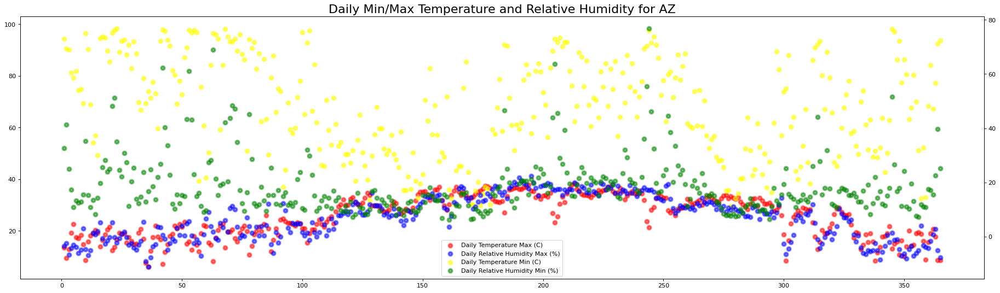

In [ ]:
temperature_extractor()

#### Bar Chart of Each State

State (Use 2-Letter Acronym): AZ
31.97
1.46
16.715


<BarContainer object of 3 artists>

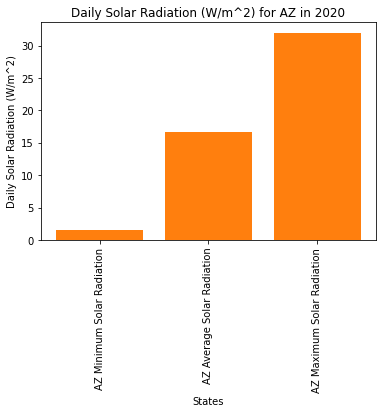

In [ ]:
#Prototype For Loop:
from google.colab import files
from matplotlib.pyplot import figure
from statistics import mean

newer_list = []
super_list = list(clean_data['State'].unique())
new_clean_data = clean_data 
getState = input('State (Use 2-Letter Acronym): ')
from statistics import mean
new_clean_data = new_clean_data.replace(-9999.0, None)
new_clean_data = new_clean_data.replace(-99.0, None)
new_clean_data

AZ_max = max(new_clean_data[new_clean_data["State"]==getState]['SOLARAD_DAILY'])
print(AZ_max)
AZ_min = min(new_clean_data[new_clean_data["State"]==getState]['SOLARAD_DAILY'])
print(AZ_min)
AZ_avg = (AZ_max + AZ_min)/2
print(AZ_avg)

StMin_R = getState + ' Minimum Solar Radiation'
StAvg_R = getState + ' Average Solar Radiation'
StMax_R = getState + ' Maximum Solar Radiation'

x= [StMin_R, StAvg_R, StMax_R]
y= [AZ_min, AZ_avg, AZ_max]

plt.bar(x, y)
plt.xlabel('States')
plt.xticks(rotation = 90)
plt.ylabel('Daily Solar Radiation (W/m^2)')
plt.title('Daily Solar Radiation (W/m^2)'+ ' for ' + getState + ' in 2020')

plt.bar(x, y)
# plt.savefig('603bar_plot' + str(power) + '.png')
# files.download('603bar_plot' + str(power) + '.png') 

State (Use 2-Letter Acronym): AZ
48.3
-15.4
16.45


<BarContainer object of 3 artists>

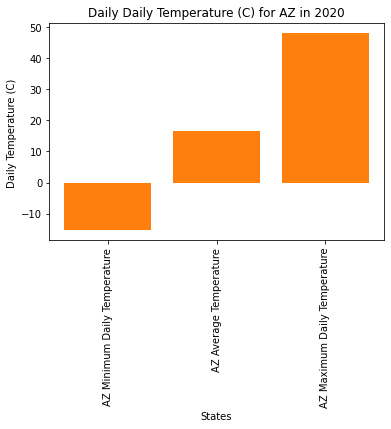

In [ ]:
#Prototype For Loop:
from google.colab import files
from matplotlib.pyplot import figure
from statistics import mean

newer_list = []
super_list = list(clean_data['State'].unique())
new_clean_data = clean_data 
getState = input('State (Use 2-Letter Acronym): ')
from statistics import mean
new_clean_data = new_clean_data.replace(-9999.0, None)
new_clean_data = new_clean_data.replace(-99.0, None)
new_clean_data

AZ_max = max(new_clean_data[new_clean_data["State"]==getState]['T_DAILY_MAX'])
print(AZ_max)
AZ_min = min(new_clean_data[new_clean_data["State"]==getState]['T_DAILY_MIN'])
print(AZ_min)
AZ_avg = (AZ_max + AZ_min)/2
print(AZ_avg)


StMin_T = getState + ' Minimum Daily Temperature'
StAvg_T = getState + ' Average Temperature'
StMax_T = getState + ' Maximum Daily Temperature'

x= [StMin_T, StAvg_T, StMax_T]
y= [AZ_min, AZ_avg, AZ_max]

plt.bar(x, y)
plt.xlabel('States')
plt.xticks(rotation = 90)
plt.ylabel('Daily Temperature (C) ')
plt.title('Daily Daily Temperature (C)'+ ' for ' + getState + ' in 2020')

plt.bar(x, y)
# plt.savefig('603bar_plot' + str(power) + '.png')
# files.download('603bar_plot' + str(power) + '.png') 

In [ ]:
new_clean_data[new_clean_data["State"]=='AK']

,"""WBANNO",LST_DATE,CRX_VN,LONGITUDE,LATITUDE,T_DAILY_MAX,T_DAILY_MIN,T_DAILY_MEAN,T_DAILY_AVG,P_DAILY_CALC,SOLARAD_DAILY,SUR_TEMP_DAILY_TYPE,SUR_TEMP_DAILY_MAX,SUR_TEMP_DAILY_MIN,SUR_TEMP_DAILY_AVG,RH_DAILY_MAX,RH_DAILY_MIN,RH_DAILY_AVG,SOIL_MOISTURE_5_DAILY,SOIL_MOISTURE_10_DAILY,SOIL_MOISTURE_20_DAILY,SOIL_MOISTURE_50_DAILY,SOIL_MOISTURE_100_DAILY,SOIL_TEMP_5_DAILY,SOIL_TEMP_10_DAILY,SOIL_TEMP_20_DAILY,SOIL_TEMP_50_DAILY,"SOIL_TEMP_100_DAILY""",State,City
0,23583,20200101,2.514,-158.61,59.28,-19.0,-27.8,-23.4,-21.0,0.0,0.31,C,-20.0,-36.2,-25.2,79.3,49.9,62.6,-99.000,-99.000,-99.000,-99.000,-99.000,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,AK,leknagik_1_NNE
1,23583,20200102,2.514,-158.61,59.28,-21.8,-28.0,-24.9,-24.1,0.0,0.90,C,-25.7,-36.4,-29.7,86.6,64.2,73.5,-99.000,-99.000,-99.000,-99.000,-99.000,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,AK,leknagik_1_NNE
2,23583,20200103,2.514,-158.61,59.28,-17.7,-22.8,-20.2,-20.2,0.0,1.22,C,-21.9,-27.1,-24.6,71.5,59.9,64.6,-99.000,-99.000,-99.000,-99.000,-99.000,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,AK,leknagik_1_NNE
3,23583,20200104,2.514,-158.61,59.28,-20.1,-26.0,-23.0,-22.3,0.0,1.19,C,-18.1,-32.2,-26.0,89.5,69.3,78.1,-99.000,-99.000,-99.000,-99.000,-99.000,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,AK,leknagik_1_NNE
4,23583,20200105,2.514,-158.61,59.28,-20.3,-25.2,-22.8,-22.3,0.0,1.23,C,-18.6,-30.9,-24.7,87.7,64.9,72.3,-99.000,-99.000,-99.000,-99.000,-99.000,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,AK,leknagik_1_NNE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,25382,20201227,2.424,-139.68,59.51,0.4,-2.5,-1.1,-0.3,3.4,0.28,C,-0.2,-9.6,-1.6,99.4,98.3,99.0,0.228,0.258,0.188,0.171,0.193,-0.3,-0.3,0.1,0.7,0.7,AK,akutat_3_SSE
8404,25382,20201228,2.424,-139.68,59.51,2.2,0.1,1.2,1.3,12.2,0.01,C,0.6,-0.5,0.2,99.3,98.1,98.7,0.228,0.258,0.188,0.171,0.193,-0.3,-0.3,0.1,0.7,0.7,AK,akutat_3_SSE
8405,25382,20201229,2.424,-139.68,59.51,3.0,1.8,2.4,2.5,15.7,0.00,C,1.0,0.5,0.7,99.0,95.8,97.9,0.228,0.258,0.188,0.171,0.193,-0.3,-0.3,0.1,0.7,0.7,AK,akutat_3_SSE
8406,25382,20201230,2.424,-139.68,59.51,3.5,-1.4,1.0,1.2,2.3,0.36,C,1.5,-5.8,-1.0,99.5,98.4,99.0,0.228,0.258,0.188,0.171,0.193,-0.3,-0.3,0.1,0.7,0.7,AK,akutat_3_SSE


In [ ]:
from statistics import mean
new_clean_data = new_clean_data.replace(-9999.0, None)
new_clean_data = new_clean_data.replace(-99.0, None)
new_clean_data



sampler = new_clean_data[new_clean_data['State'] == 'AZ']
print(sampler[sampler['SOLARAD_DAILY']==max(sampler['SOLARAD_DAILY'])]['SOLARAD_DAILY'].sort_values())
print(sampler[sampler['SOLARAD_DAILY']==max(sampler['SOLARAD_DAILY'])]['LST_DATE'].sort_values())
print('Min:',sampler['T_DAILY_MIN'][16480])
print('Max:',sampler['T_DAILY_MAX'][16480])


15888    31.97
Name: SOLARAD_DAILY, dtype: float64
15888    20200609
Name: LST_DATE, dtype: int64
Min: 0.8
Max: 4.7


Linear Regression Analysis

In [ ]:
#Quick statistical analysis with Scikit Learn or Apache Spark Machine Learning  - maybe linear regression:\
# Assistance received from DataCamp on conducting a linear regression analysis with Apache Spark: https://www.datacamp.com/community/tutorials/apache-spark-tutorial-machine-learning#model

sparkDF = spark.createDataFrame(new_clean_data)

newsparkDF = sparkDF.select("T_DAILY_MEAN", "SOLARAD_DAILY")

#Map the data:
input_data = newsparkDF.rdd.map(lambda x: (x[0], DenseVector(x[1:])))

#New df: 
df = spark.createDataFrame(input_data, ["label", "features"])

#Normalize the data: 
standardScaler = StandardScaler(inputCol="features", outputCol="features_scaled")

# Fit the DataFrame to the scaler
scaler = standardScaler.fit(df)

# Transform the data in `df` with the scaler
scaled_df = scaler.transform(df)

# Inspect the result
scaled_df.take(2)

# Instantiate your training and testing data. Be sure to split it | 80:20: 
train_data, test_data = scaled_df.randomSplit([.8,.2],seed=10)


In [ ]:
print(input_data.collect())

[(-23.4, DenseVector([0.31])), (-24.9, DenseVector([0.9])), (-20.2, DenseVector([1.22])), (-23.0, DenseVector([1.19])), (-22.8, DenseVector([1.23])), (-26.7, DenseVector([1.34])), (-25.0, DenseVector([0.58])), (-22.1, DenseVector([0.81])), (-16.2, DenseVector([0.72])), (-15.0, DenseVector([0.11])), (-10.8, DenseVector([0.37])), (-4.5, DenseVector([0.95])), (-5.5, DenseVector([0.68])), (-11.0, DenseVector([1.75])), (-13.1, DenseVector([1.76])), (-14.9, DenseVector([1.86])), (-15.3, DenseVector([1.82])), (-10.2, DenseVector([0.19])), (-13.4, DenseVector([0.92])), (-14.1, DenseVector([0.48])), (-19.5, DenseVector([1.71])), (-23.1, DenseVector([2.46])), (-20.0, DenseVector([2.85])), (-14.4, DenseVector([2.56])), (-13.3, DenseVector([2.68])), (-16.7, DenseVector([2.71])), (-19.6, DenseVector([2.75])), (-24.3, DenseVector([1.6])), (-22.8, DenseVector([1.22])), (-22.9, DenseVector([1.44])), (-24.2, DenseVector([3.19])), (-26.0, DenseVector([2.21])), (-11.8, DenseVector([0.41])), (-1.8, DenseV

In [ ]:
newsparkDF.show()

+------------+-------------+
|T_DAILY_MEAN|SOLARAD_DAILY|
+------------+-------------+
|       -23.4|         0.31|
|       -24.9|          0.9|
|       -20.2|         1.22|
|       -23.0|         1.19|
|       -22.8|         1.23|
|       -26.7|         1.34|
|       -25.0|         0.58|
|       -22.1|         0.81|
|       -16.2|         0.72|
|       -15.0|         0.11|
|       -10.8|         0.37|
|        -4.5|         0.95|
|        -5.5|         0.68|
|       -11.0|         1.75|
|       -13.1|         1.76|
|       -14.9|         1.86|
|       -15.3|         1.82|
|       -10.2|         0.19|
|       -13.4|         0.92|
|       -14.1|         0.48|
+------------+-------------+
only showing top 20 rows



In [ ]:
train_data.show()

+-----+--------+--------------------+
|label|features|     features_scaled|
+-----+--------+--------------------+
|-28.5|  [3.82]|[0.4635272315397603]|
|-26.7|  [1.34]|[0.16259855766054...|
|-26.6|  [2.89]|[0.3506789788350543]|
|-26.5|  [1.77]|[0.21477570676056...|
|-25.5|  [1.32]|[0.16017171351635...|
|-25.3|  [2.03]|[0.24632468063500...|
|-25.0|  [0.58]|[0.07037848018142...|
|-24.9|   [0.9]|[0.1092079864884252]|
|-24.8|  [1.88]|[0.22812334955359...|
|-24.3|   [1.6]|[0.19414753153497...|
|-24.2|  [3.19]|[0.38708164099786...|
|-24.1|  [1.14]|[0.1383301162186719]|
|-24.0|  [2.44]|[0.2960749855908416]|
|-23.5|  [1.13]|[0.1371166941465783]|
|-23.4|  [0.31]|[0.03761608423490...|
|-23.1|  [2.46]|[0.29850182973502...|
|-23.0|  [1.19]|[0.14439722657913...|
|-23.0|  [2.16]|[0.26209916757222...|
|-22.9|  [1.44]|[0.1747327783814803]|
|-22.8|  [1.22]|[0.1480374927954208]|
+-----+--------+--------------------+
only showing top 20 rows



In [ ]:
# Instantiate the linear regression model: 
lr = LinearRegression(labelCol="label", maxIter=10, regParam=0.3, elasticNetParam=0.8).setFeaturesCol("features_scaled").setLabelCol("label")       

In [ ]:
linearModel = lr.fit(train_data)

In [ ]:
# Generate predictions
predicted = linearModel.transform(test_data)

In [ ]:
# Coefficients for the model
b = linearModel.coefficients

In [ ]:
# Intercept for the model
m = linearModel.intercept

In [ ]:
# Extract the predictions and the "known" correct labels
predictions = predicted.select("prediction").rdd.map(lambda x: x[0])
labels = predicted.select("label").rdd.map(lambda x: x[0])

In [ ]:
# Zip `predictions` and `labels` into a list
predictionAndLabel = predictions.zip(labels).collect()

In [ ]:
# Print out first 5 instances of `predictionAndLabel` 
predictionAndLabel[:]

[(5.989720014163593, -27.0),
 (5.9539329781248185, -26.7),
 (6.316276718017411, -26.0),
 (6.709934114443932, -25.0),
 (6.817295222560255, -24.5),
 (5.801838074960027, -24.1),
 (5.690003587338857, -22.1),
 (8.382978049256643, -21.7),
 (5.873412147037576, -21.2),
 (5.533435304669218, -20.9),
 (8.91978358983826, -19.4),
 (6.973863505229894, -19.2),
 (7.295946829578865, -19.0),
 (9.067405113498207, -19.0),
 (10.09180902010813, -18.1),
 (8.772162066178316, -17.6),
 (7.524089184326053, -17.1),
 (6.539945693259753, -16.7),
 (5.569222340707992, -16.5),
 (5.904725803571504, -16.0),
 (5.4081806785335065, -15.4),
 (5.448441094077128, -15.1),
 (6.159708435347773, -14.9),
 (8.503759295887507, -12.2),
 (5.569222340707992, -11.7),
 (5.457387853086821, -11.5),
 (10.208116887234146, -9.5),
 (5.761577659416406, -8.0),
 (5.649743171795235, -7.8),
 (5.327659847446264, -7.7),
 (5.399233919523813, -6.2),
 (5.918145942086045, -6.0),
 (5.327659847446264, -4.4),
 (5.390287160514119, -3.4),
 (8.848209517760713,

In [ ]:
new_predictions = []
for x in predictions.collect():
  new_predictions += [x]

In [ ]:
new_labels = []
for y in labels.collect():
  new_labels += [y]

ValueError: ignored

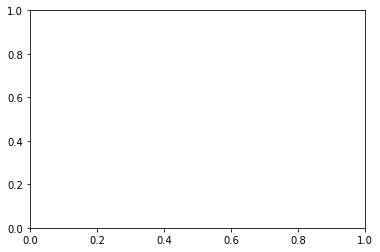

In [ ]:
plt.plot(x, new_predictions, color='b')

plt.scatter(x, y, c ='gray')

print(m)
print(b)

#plt.plot(x, m*x + b[0], c='red')

plt.show
plt.title('Linear Regression of Average Temperature, Solar Radiation, Relative Humidity, and Latitude')
plt.xlabel('Solar Radiation')
plt.ylabel("Average Temperature")

In [ ]:
# Get the RMSE
linearModel.summary.rootMeanSquaredError

# Get the R2
linearModel.summary.r2

0.5882115467375333